# Segment Anything(SAM)

Reference from Notebook of `segment-anything`: [Segment Anything Example Notebook](https://github.com/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb)


#### **References**
- [Segment Anything - Meta AI](https://segment-anything.com/)
- [SAM Official Github](https://github.com/facebookresearch/segment-anything)
- [SAM - HuggingFace Docs](https://huggingface.co/docs/transformers/en/model_doc/sam)
- [SAM - Offical Paper](https://arxiv.org/abs/2304.02643)
- [SAM2 - Meta AI](https://ai.meta.com/blog/segment-anything-2/)
- Other related papers:
  - [Grounded SAM: Assembling Open-World Models for Diverse Visual Tasks](https://arxiv.org/abs/2401.14159)


In [ ]:
import requests
import warnings
import numpy as np

import torch

from PIL import Image
from transformers import SamModel, SamProcessor

from matplotlib import pyplot as plt
# warnings.filterwarnings("ignore")

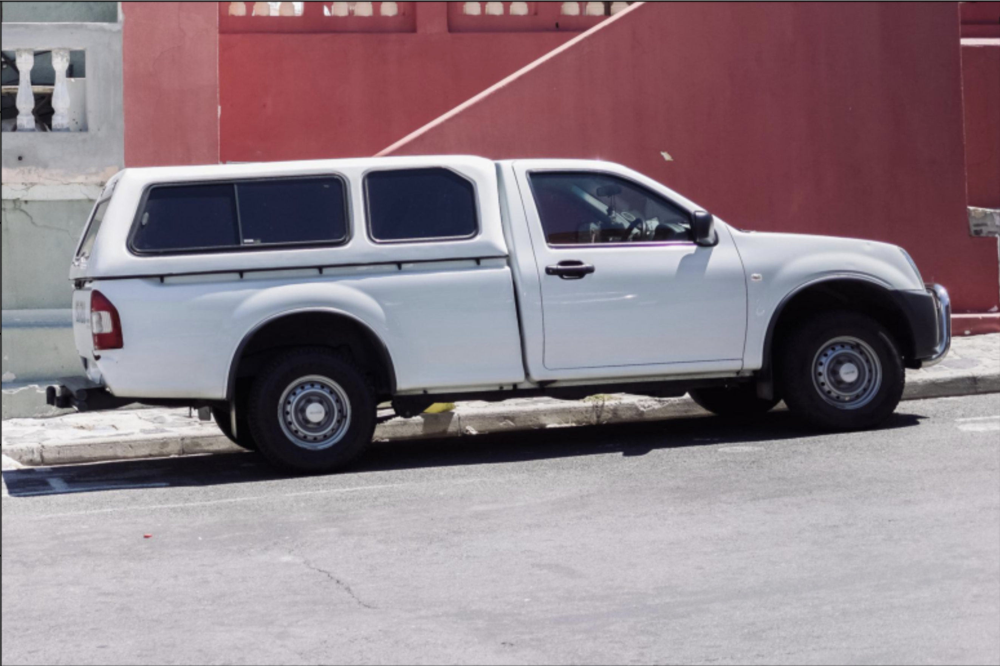

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
img_url = "https://huggingface.co/ybelkada/segment-anything/resolve/main/assets/car.png"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert("RGB")
raw_image

### Utility Functions

> Note: `plt.gca()` returns the current Axes instance on the current figure, which allows us toi interact with or modify the properties of the axes.


See Documentation: [Matplotlib Docs](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.gca.html)



In [ ]:
def show_mask(mask, ax, random_color=False):
    """
    Display a mask on a given axis, with optional random color.

    Args:
        mask (numpy.ndarray): The binary mask to display, with dimensions (H, W).
        ax (matplotlib.axes.Axes): The axis to plot the mask on.
        random_color (bool): If True, use a random color for the mask. Otherwise, use a predefined color (default: False).

    Returns:
        None: Displays the mask on the given axis.
    """
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_masks_on_image(raw_image, masks, scores):
    """
    Display multiple masks on a raw image along with their scores.

    Args:
        raw_image (numpy.ndarray): The raw image to plot the masks on.
        masks (torch.Tensor or numpy.ndarray): A 3D tensor/array of masks, either (num_masks, H, W) or (1, num_masks, H, W).
        scores (torch.Tensor or numpy.ndarray): A 1D array of scores corresponding to each mask.

    Returns:
        None: Displays the masks on the raw image in subplots.
    """
    if len(masks.shape) == 4:
        masks = masks.squeeze()
    if scores.shape[0] == 1:
        scores = scores.squeeze()

    nb_predictions = scores.shape[-1]
    fig, axes = plt.subplots(1, nb_predictions, figsize=(10, 10))

    for i, (mask, score) in enumerate(zip(masks, scores)):
        mask = mask.cpu().detach()
        axes[i].imshow(np.array(raw_image))
        show_mask(mask, axes[i])
        axes[i].title.set_text(f"Mask {i+1}, Score: {score.item():.3f}")
        axes[i].axis("off")
    plt.tight_layout()
    plt.show()


def show_box(box, ax):
    """
    Display a bounding box on a given axis.

    Args:
        box (array-like): The bounding box coordinates as [x_min, y_min, x_max, y_max].
        ax (matplotlib.axes.Axes): The axis to plot the bounding box on.

    Returns:
        None: Adds a bounding box patch to the given axis.
    """
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor="green", fill=False, linewidth=2))


def show_boxes_on_image(raw_image, boxes):
    """
    Display multiple bounding boxes on a raw image.

    Args:
        raw_image (numpy.ndarray): The raw image to plot the boxes on.
        boxes (list of arrays): A list of bounding boxes, where each box is represented as [x_min, y_min, x_max, y_max].

    Returns:
        None: Displays the image with the bounding boxes.
    """
    plt.figure(figsize=(10, 10))
    plt.imshow(raw_image)
    for box in boxes:
        show_box(box, plt.gca())
    plt.axis('on')
    plt.show()


def show_points(coords, labels, ax, marker_size=375):
    """
    Display labeled points on a given axis with different markers for positive and negative points.

    Args:
        coords (numpy.ndarray): A 2D array of coordinates, with shape (num_points, 2).
        labels (numpy.ndarray): A 1D array of labels corresponding to each point (1 for positive, 0 for negative).
        ax (matplotlib.axes.Axes): The axis to plot the points on.
        marker_size (int): Size of the points (default: 375).

    Returns:
        None: Plots the labeled points on the given axis.
    """
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1],
               color="green", marker="*", s=marker_size,
               edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1],
               color='red', marker='*', s=marker_size,
               edgecolor='white', linewidth=1.25)

def show_points_on_image(raw_image, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    plt.axis('on')
    plt.show()


def show_points_and_boxes_on_image(raw_image, boxes, input_points, input_labels=None):
    """
    Display points and bounding boxes on a raw image.

    Args:
        raw_image (numpy.ndarray): The raw image to plot the points and boxes on.
        boxes (list of arrays): A list of bounding boxes, each as [x_min, y_min, x_max, y_max].
        input_points (numpy.ndarray): A 2D array of point coordinates, with shape (num_points, 2).
        input_labels (numpy.ndarray or None): A 1D array of labels for each point (1 for positive, 0 for negative). If None, all points are considered positive.

    Returns:
        None: Displays the image with points and boxes.
    """
    plt.figure(figsize=(10, 10))
    plt.imshow(raw_image)

    input_points = np.array(input_points)
    if input_labels is None:
        labels = np.ones_like(input_points[:, 0])
    else:
        labels = np.array(input_labels)

    show_points(input_points, labels, plt.gca())
    for box in boxes:
        show_box(box, plt.gca())
    plt.axis('on')
    plt.show()

### Load the Model and Preprocessor

In [ ]:
model = SamModel.from_pretrained("facebook/sam-vit-huge").to(device)
processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")

config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.56G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

#### Model Overview

##### 1. Shared Image Embedding
- **`SamPositionalEmbedding`**: This layer helps to add positional information to the image embeddings, allowing the model to understand the spatial relationships within the input images.

##### 2. Vision Encoder
The vision encoder is responsible for extracting features from the input images and consists of several sub-components:

- **`SamPatchEmbeddings`**:
  - **`projection`**: A convolutional layer that projects the input image (with 3 channels) into a higher-dimensional space (1280 channels) using a 16x16 kernel and a stride of 16, effectively breaking the image into patches.

- **`layers`**: A series of 32 `SamVisionLayer` instances that perform the main feature extraction:
  - **`layer_norm1`**: Normalizes the inputs to stabilize training.
  - **`attn`**: Contains the attention mechanism:
    - **`qkv`**: A linear layer that computes the queries, keys, and values for the attention mechanism.
    - **`proj`**: A linear layer that projects the output of the attention mechanism back to the feature space.
  - **`layer_norm2`**: Another normalization layer.
  - **`mlp`**: A multi-layer perceptron (MLP) block for additional processing:
    - **`lin1`** and **`lin2`**: Linear layers that increase and then reduce the feature dimensions, respectively.
    - **`act`**: Activation function (GELU) for introducing non-linearity.

- **`neck`**: Further processes the encoded features:
  - **`conv1`**: A convolutional layer that reduces the number of channels from 1280 to 256.
  - **`layer_norm1`**: Normalization after the first convolution.
  - **`conv2`**: Another convolutional layer that maintains 256 channels with 3x3 kernels.
  - **`layer_norm2`**: Final normalization in the neck.

##### 3. Prompt Encoder
The prompt encoder processes user input and includes various embedding layers for different types of prompts:

- **`shared_embedding`**: Positional embedding for prompts.
- **`mask_embed`**: Handles embeddings for masks:
  - **Convolutional layers** (`conv1`, `conv2`, `conv3`) progressively transform the mask embeddings.
  - **Layer Normalization** (`layer_norm1`, `layer_norm2`) for stabilizing the training.
- **`no_mask_embed`**: Embedding for cases with no mask.
- **`point_embed`**: A list of embeddings for point inputs.
- **`not_a_point_embed`**: Embedding for non-point prompts.

##### 4. Mask Decoder
The mask decoder generates the final segmentation masks based on the features and prompts:

- **`iou_token`**: An embedding for Intersection over Union (IoU) prediction.
- **`mask_tokens`**: Embeddings for multiple mask outputs.
- **`transformer`**: A two-way transformer for processing interactions between mask tokens and image features:
  - **`layers`**: Consists of two `SamTwoWayAttentionBlock`s, each containing:
    - **Self-attention** (`self_attn`): Attends to the input tokens.
    - **Cross-attention** (`cross_attn_token_to_image` and `cross_attn_image_to_token`): Handles interactions between the tokens and the image features.
    - **MLP**: Similar to the vision layers, consists of linear layers and activations for processing.
    - **Layer Norm**: Normalization layers throughout the block.
- **`final_attn_token_to_image`**: Attention layer for final processing.
- **`layer_norm_final_attn`**: Normalization for the final attention output.
- **Upscaling layers** (`upscale_conv1`, `upscale_conv2`): Transpose convolutions for increasing the spatial resolution of the outputs.
- **Final layers**:
  - **`output_hypernetworks_mlps`**: A set of feed-forward networks for generating the final output masks.
  - **`iou_prediction_head`**: A specific head for predicting the IoU using a feed-forward architecture.


In [ ]:
model

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-31): 32 x SamVisionLayer(
        (layer_norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (layer_norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNor

#### Preprocessor

| **Parameter**         | **Value**                                                                                               | **Description**                                                                                   |
|-----------------------|---------------------------------------------------------------------------------------------------------|---------------------------------------------------------------------------------------------------|
| `do_convert_rgb`      | `true`                                                                                                  | Converts the input image to RGB format, which is the standard color format for most models.        |
| `do_normalize`        | `true`                                                                                                  | Normalizes pixel values using the mean and standard deviation for each RGB channel.                |
| `do_pad`              | `true`                                                                                                  | Adds padding to the image to meet a specified size (`pad_size`).                                  |
| `do_rescale`          | `true`                                                                                                  | Rescales pixel values by a factor (`rescale_factor`), typically to normalize the range (0-1).      |
| `do_resize`           | `true`                                                                                                  | Resizes the image to a target size (`size`) for consistent input dimensions in the model.          |
| `image_mean`          | `[0.485, 0.456, 0.406]`                                                                                 | Mean pixel values for the RGB channels used in normalization (Red, Green, Blue).                   |
| `image_processor_type`| `"SamImageProcessor"`                                                                                    | Specifies the type of image processor being used.                                                  |
| `image_std`           | `[0.229, 0.224, 0.225]`                                                                                 | Standard deviation for each RGB channel used in normalization.                                     |
| `mask_pad_size`       | `{ "height": 256, "width": 256 }`                                                                       | Size to which masks are padded for tasks like segmentation.                                        |
| `mask_size`           | `{ "longest_edge": 256 }`                                                                               | Specifies that the longest edge of the mask should be resized to 256 pixels.                       |
| `pad_size`            | `{ "height": 1024, "width": 1024 }`                                                                     | Target size for padding the input images if they are smaller.                                      |
| `processor_class`     | `"SamProcessor"`                                                                                         | Specifies the class of the image processor handling the transformations.                           |
| `resample`            | `2`                                                                                                     | Refers to the resampling method (2 = bilinear interpolation) used for resizing images.             |
| `rescale_factor`      | `0.00392156862745098`                                                                                   | Rescaling factor for normalizing pixel values from the range [0, 255] to [0, 1] (1/255).           |
| `size`                | `{ "longest_edge": 1024 }`                                                                              | Defines the target size for resizing the image's longest edge to 1024 pixels while maintaining aspect ratio. |

In [ ]:
inputs = processor(raw_image, return_tensors="pt").to(device)
print("Preprocessed image keys: ", inputs.keys())
print(">>>Preprocessed image pixel values shape: ", inputs.pixel_values.shape)
print(">>>Original image size: ", inputs.original_sizes)
print(">>>Reshaped image size: ", inputs.reshaped_input_sizes)

Preprocessed image keys:  dict_keys(['pixel_values', 'original_sizes', 'reshaped_input_sizes'])
>>>Preprocessed image pixel values shape:  torch.Size([1, 3, 1024, 1024])
>>>Original image size:  tensor([[1764, 2646]])
>>>Reshaped image size:  tensor([[ 683, 1024]])


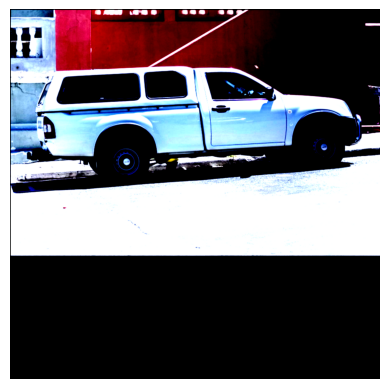

In [ ]:
plt.imshow(inputs.pixel_values.cpu().squeeze().permute(1, 2, 0))
plt.axis('off')
plt.show()

### Generate Image Embeddings
To avoid recalculating the same embeddings repeatedly, we'll compute them once and reuse these embeddings for faster inference by directly feeding them into the model.

In [ ]:
image_embeddings = model.get_image_embeddings(inputs['pixel_values'])
image_embeddings.shape

torch.Size([1, 256, 64, 64])

### Case-1: Not using inputs_points while preprocessing image
`input_points` parameter is given to `preprocessor`, which is used by the prompt encoder to encode the promt. Generally, it can generate the better result.

For a first case, let's not use any input_points, to see model performace if no input_points is given

In [ ]:
# pop the value of pixel_values as they are not needed,
# and update the image embedding which we had calculated
inputs.pop('pixel_values')
inputs.update({'image_embeddings': image_embeddings})

with torch.no_grad():
  outputs = model(**inputs)

In [ ]:
masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"].cpu(),
                                                     inputs["reshaped_input_sizes"].cpu())

print("Output postprocessed mask shape: ", masks[0].shape)
print("Output IOU Scores: ", outputs.iou_scores)

Output postprocessed mask shape:  torch.Size([1, 3, 1764, 2646])
Output IOU Scores:  tensor([[[0.4273, 0.4177, 0.5799]]])


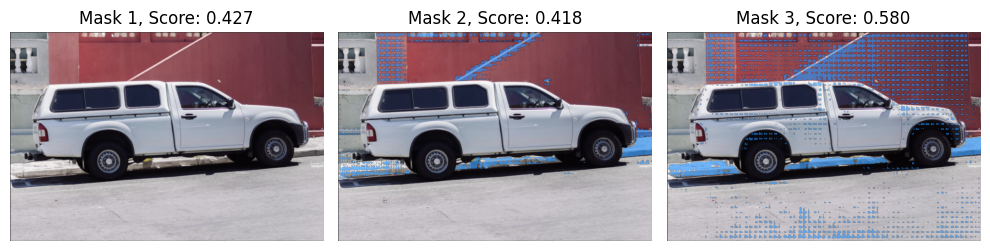

In [ ]:
show_masks_on_image(raw_image, masks[0], outputs.iou_scores)

The segmentation seems random and quality of segmented objects is not good

### Case-2: Feed a set of 2D points to predict a mask

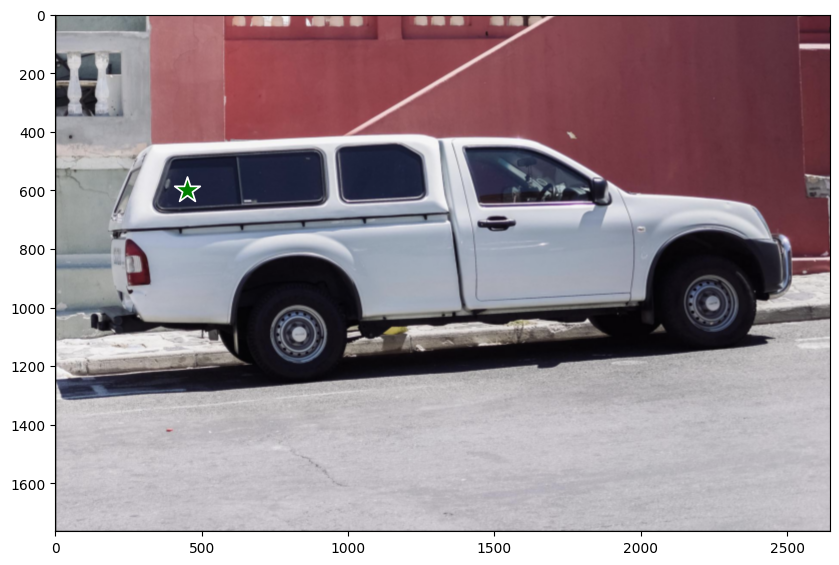

In [ ]:
input_points = [[[450, 600]]]
show_points_on_image(raw_image, input_points[0])

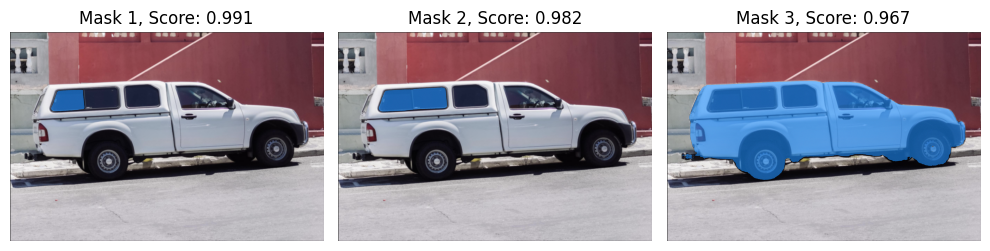

In [ ]:
inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)

# pop the pixel values
inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
  outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"].cpu(),
                                                     inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

show_masks_on_image(raw_image, masks[0], scores)

As you can see, the predicted masks are sorted in their IoU score order. The first mask indeed seems to correspond to the mask of the top right window of the parked car.

You can also feed a set of points to predict a single mask. Let's try to predict a mask, given two points

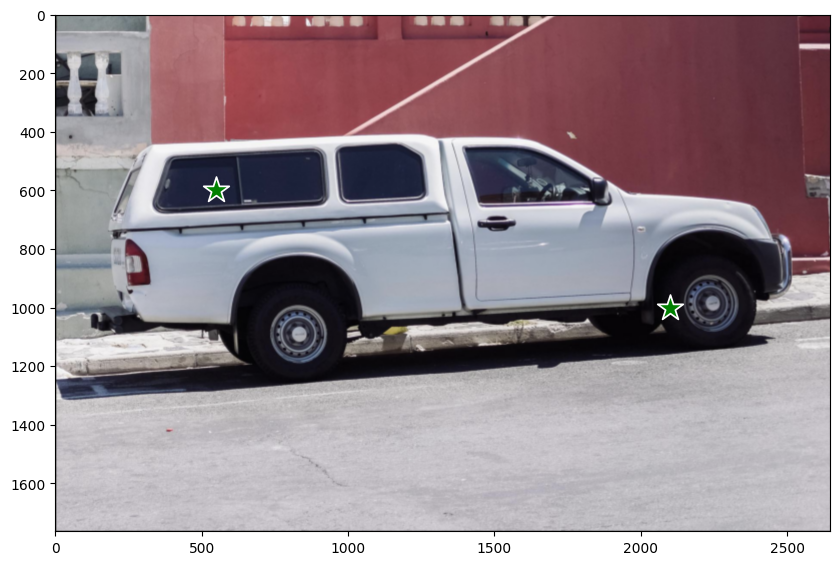

In [ ]:
input_points = [[[550, 600], [2100, 1000]]]
show_points_on_image(raw_image, input_points)

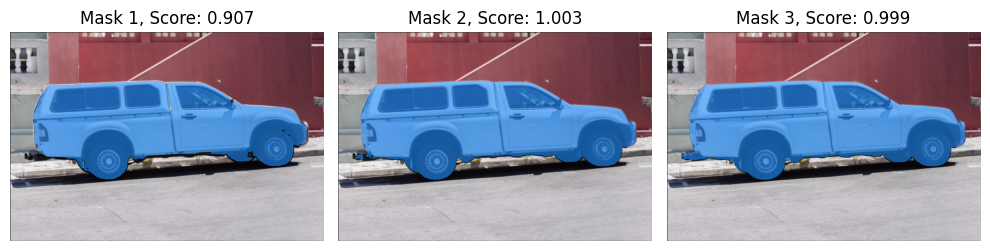

In [ ]:
inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)
inputs.pop('pixel_values', None)
inputs.update({'image_embeddings': image_embeddings})

with torch.no_grad():
  outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"].cpu(),
                                                     inputs["reshaped_input_sizes"])
scores = outputs.iou_scores
show_masks_on_image(raw_image, masks[0], scores)

### Case 3: Predicting Segmentation Masks Using Bounding Boxes

We can use bounding boxes as input to the model to predict the segmentation masks for the objects of interest within those regions.

The bounding box should be represented as a list of points, which correspond to the flattened coordinates of the top-left and bottom-right corners.

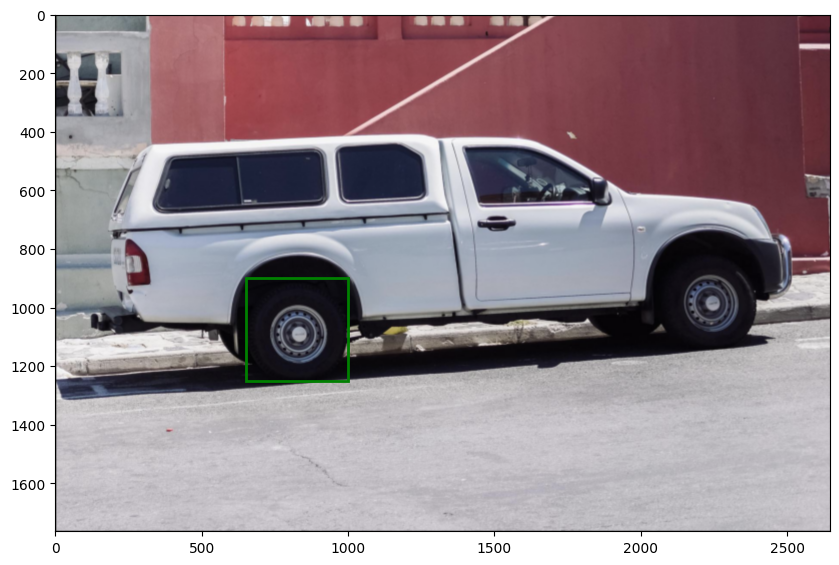

In [ ]:
input_boxes = [[[650, 900, 1000, 1250]]] # [[x_min, y_min, x_max, y_max]]
show_boxes_on_image(raw_image, input_boxes[0])

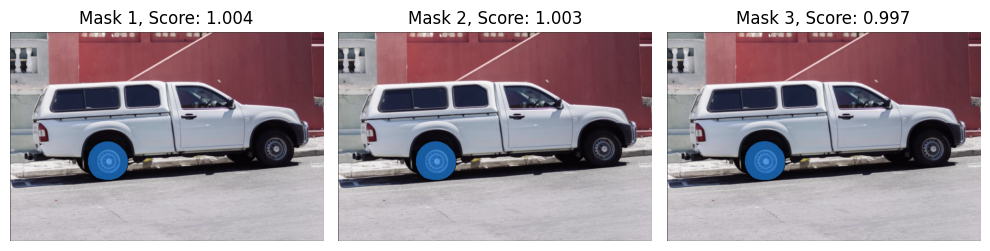

In [ ]:
inputs = processor(raw_image, input_boxes=input_boxes, return_tensors="pt").to(device)
inputs.pop('pixel_values', None)
inputs.update({'image_embeddings': image_embeddings})

with torch.no_grad():
  outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"].cpu(),
                                                     inputs["reshaped_input_sizes"])
scores = outputs.iou_scores
show_masks_on_image(raw_image, masks[0], scores)

### Case-4: Predict Segmentation masks Given points and bounding boxes

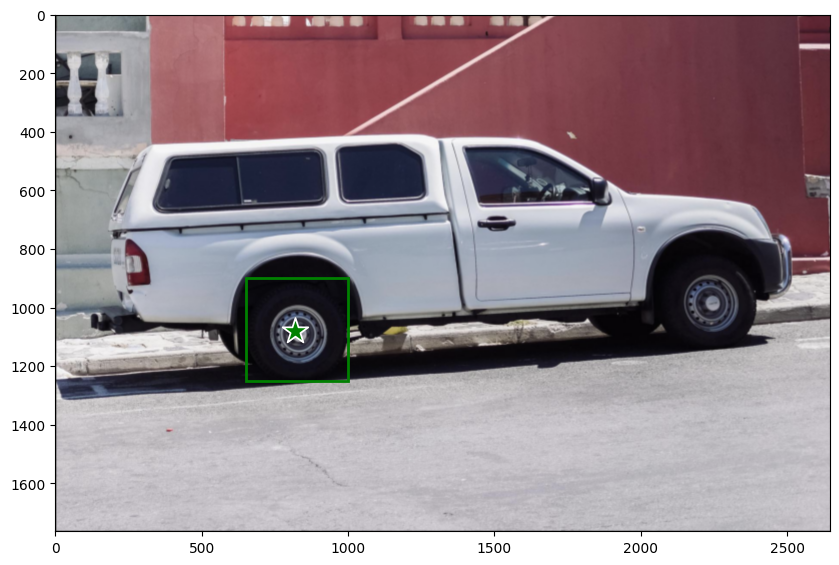

In [ ]:
input_boxes = [[[650, 900, 1000, 1250]]]
input_points = [[[820, 1080]]]

show_points_and_boxes_on_image(raw_image, boxes=input_boxes[0], input_points=input_points[0])

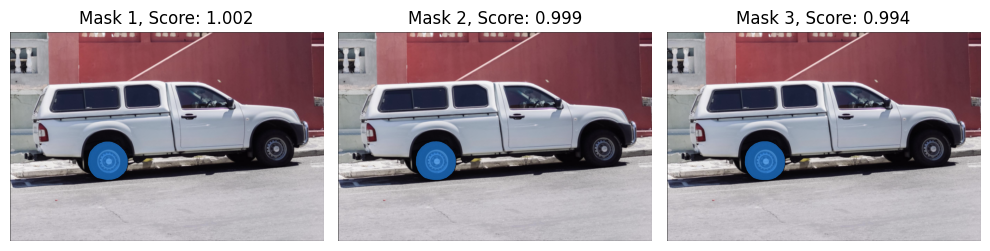

In [ ]:
inputs = processor(raw_image, input_boxes=[input_boxes], input_points=input_points, return_tensors="pt").to(device)

inputs.pop('pixel_values', None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
  outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"].cpu(),
                                                     inputs["reshaped_input_sizes"])
scores = outputs.iou_scores
show_masks_on_image(raw_image, masks[0], scores)

**We can also provide labeled points to define the segmentation of a region:**

- `0`: Do not segment this region (exclude it)
- `1`: (Default behavior) Segment this region

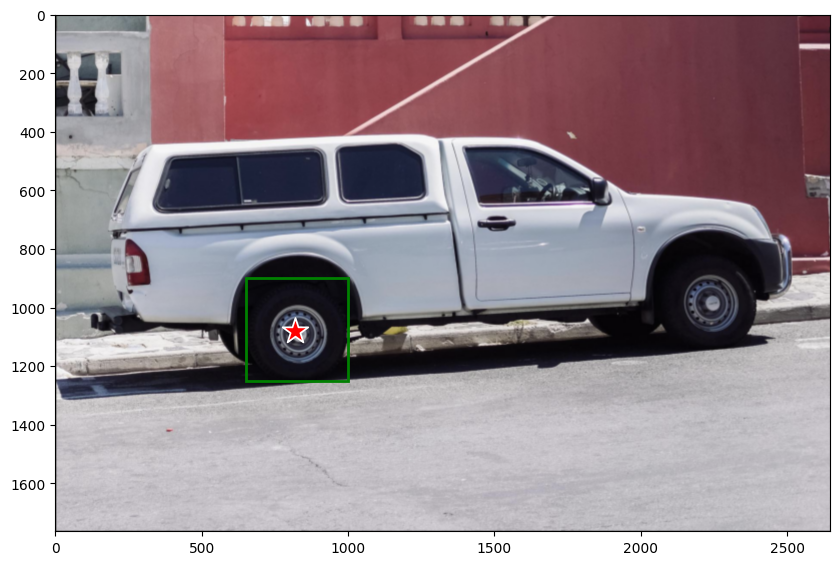

In [ ]:
input_boxes = [[[650, 900, 1000, 1250]]]
input_points = [[[820, 1080]]]
labels = [0]

show_points_and_boxes_on_image(raw_image, input_boxes[0], input_points[0], labels)

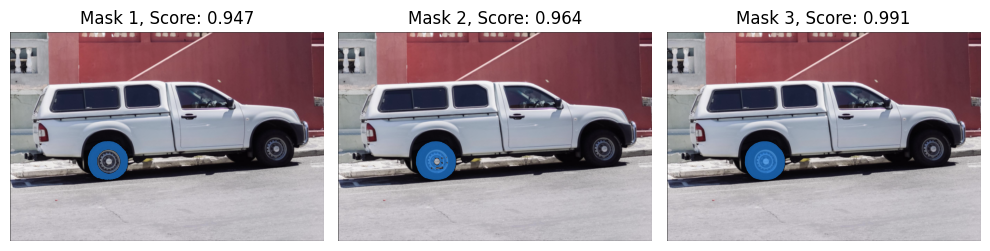

In [ ]:
inputs = processor(raw_image, input_boxes=[input_boxes], input_points=[input_points],
                   input_labels=[labels], return_tensors="pt").to(device)

inputs.pop('pixel_values', None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
  outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"],
                                                     inputs["reshaped_input_sizes"])
scores = outputs.iou_scores

show_masks_on_image(raw_image, masks[0], scores)

### Cases-4: Predict multiple masks Per Image
With SAM, we can predict multiple masks per image. It can be achived in two possible scenarios
- Feed multiple points in the `nb_predictions` dimension
- Feed multiple bounding boxes to the same image

#### Subcase 1: One prediction per point

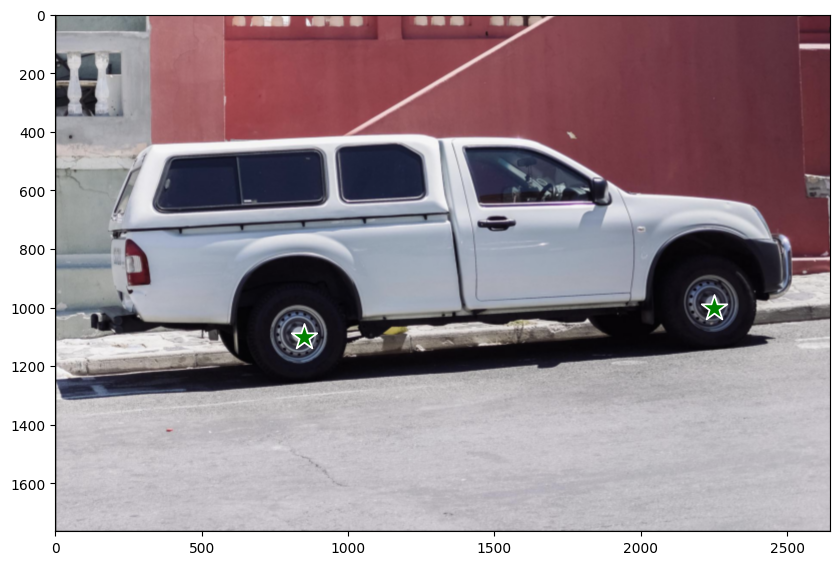

In [ ]:
input_points = [[[850, 1100], [2250, 1000]]]
show_points_on_image(raw_image, input_points)

In [ ]:
# change the dimension of input points to include the multiple points for segementation
input_points = [[[[850, 1100]], [[2250, 1000]]]]
inputs = processor(raw_image, input_points=input_points, return_tensors="pt").to(device)

print("- Shape of the input_points: ", inputs.input_points.shape)
inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
  outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"].cpu(),
                                                     inputs["reshaped_input_sizes"])
scores = outputs.iou_scores
print("<<< Shape of the masks: ", masks[0].shape)
print("<<< Shape of output scores: ", scores.shape)

- Shape of the input_points:  torch.Size([1, 2, 1, 2])
<<< Shape of the masks:  torch.Size([2, 3, 1764, 2646])
<<< Shape of output scores:  torch.Size([1, 2, 3])


In `scores`, the first dimension represents the batch size of images, the second dimension corresponds to the number of predictions (`nb_predictions`), and the last dimension indicates the number of predicted masks **per prediction**, which is set to 3 by default according to the official implementation.

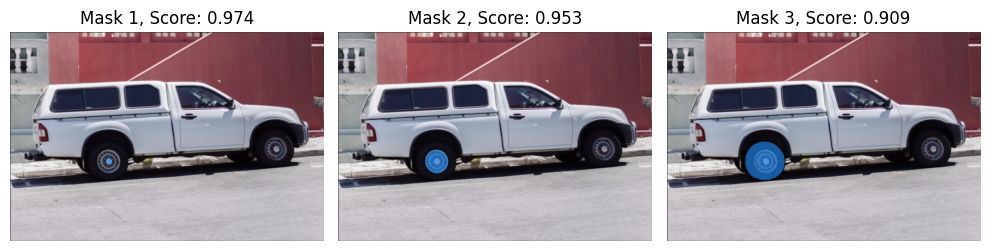

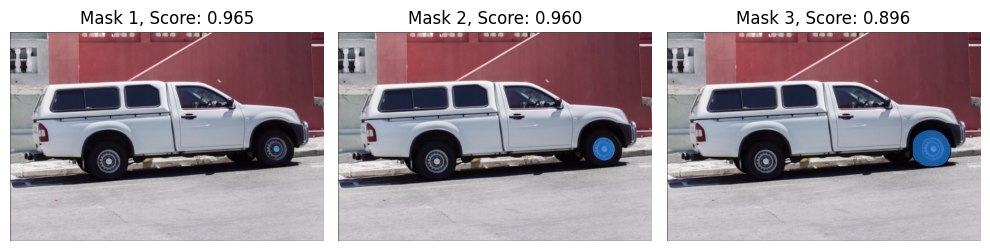

In [ ]:
show_masks_on_image(raw_image, masks[0][0], scores[:, 0, :])
show_masks_on_image(raw_image, masks[0][1], scores[:, 1, :])

#### Subcase 2: Input Multiple Bounding Boxes for a Single Image  
We can input several bounding boxes for the same image, generating one prediction for each bounding box.

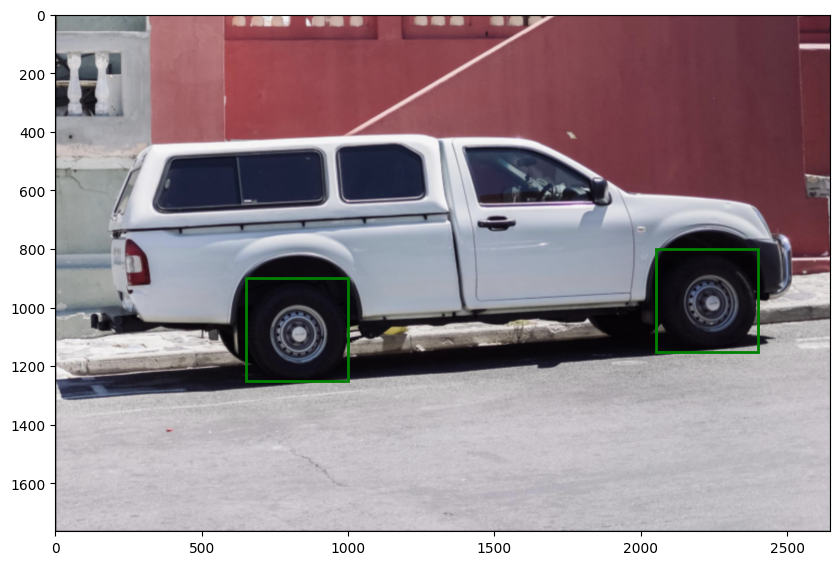

In [ ]:
input_boxes = [[[650, 900, 1000, 1250], [2050, 800, 2400, 1150]]]

show_boxes_on_image(raw_image, input_boxes[0])

In [ ]:
inputs = processor(raw_image, input_boxes=input_boxes, return_tensors="pt").to(device)
inputs.pop('pixel_values', None)
inputs.update({'image_embeddings': image_embeddings})

with torch.no_grad():
  # pass multimask_output=False for one output per mask
  outputs = model(**inputs, multimask_output=False)

masks = processor.image_processor.post_process_masks(outputs.pred_masks.cpu(),
                                                     inputs["original_sizes"].cpu(),
                                                     inputs["reshaped_input_sizes"])
scores = outputs.iou_scores
print("<<< Shape of the masks: ", masks[0].shape)
print("<<< Shape of output scores: ", scores.shape)

<<< Shape of the masks:  torch.Size([2, 1, 1764, 2646])
<<< Shape of output scores:  torch.Size([1, 2, 1])


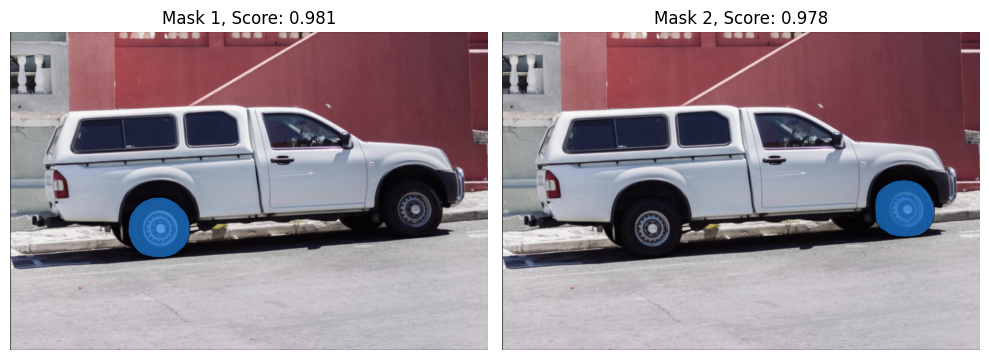

In [ ]:
show_masks_on_image(raw_image, masks[0], scores)